<a href="https://colab.research.google.com/github/sajid19/DOg_breed_Detection/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-End Dog Breed Detection

This notebook build a multiclass image classifier using Tenserflow 2.0 and Tenserflow hub

## 1. Problem
Identifying the breed of the dog given an image of a dog.
When I am roaming around outside of home ,wherever i see any dog ,I want to detect it's breed
## 2. Data
The data we are using it's from kaggle dog breed competition
https://www.kaggle.com/c/dog-breed-identification/data
## 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image
## 4. Features
* We are dealing with images(Unstructured Data) so it will be best to use deeplearning/ transfer learning
* There are 120 different breeds of Dogs.(That's mean there are 20 different of classes)

In [ ]:
#!unzip "drive/MyDrive/Dog Vision/test.zip" -d "drive/MyDrive/Dog Vision/"
#unziped the uploaded data in google drive


# Get our work space Ready
* Import tensorflow 2.x
* Import tensorflow hub
* Make sure we are using a GPU

In [1]:
# Import Tensorflow in Colab
import tensorflow as tf
print("Tf version", tf.__version__)



Tf version 2.8.0


In [2]:
# Now import TensorFlow hub
import tensorflow_hub as hub
print("Tf Hub version, ",hub.__version__)

Tf Hub version,  0.12.0


In [3]:
# Check for GPU availability
print("Gpu", "Available" if tf.config.list_physical_devices("GPU")else "Not Available")



Gpu Available


## Getting our data ready ( Turning into Tensor)
With all machine learning model all of our data should be in numerical form

In [4]:
# Check the label of our data
import pandas as pd
label_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

In [5]:


label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [6]:

label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


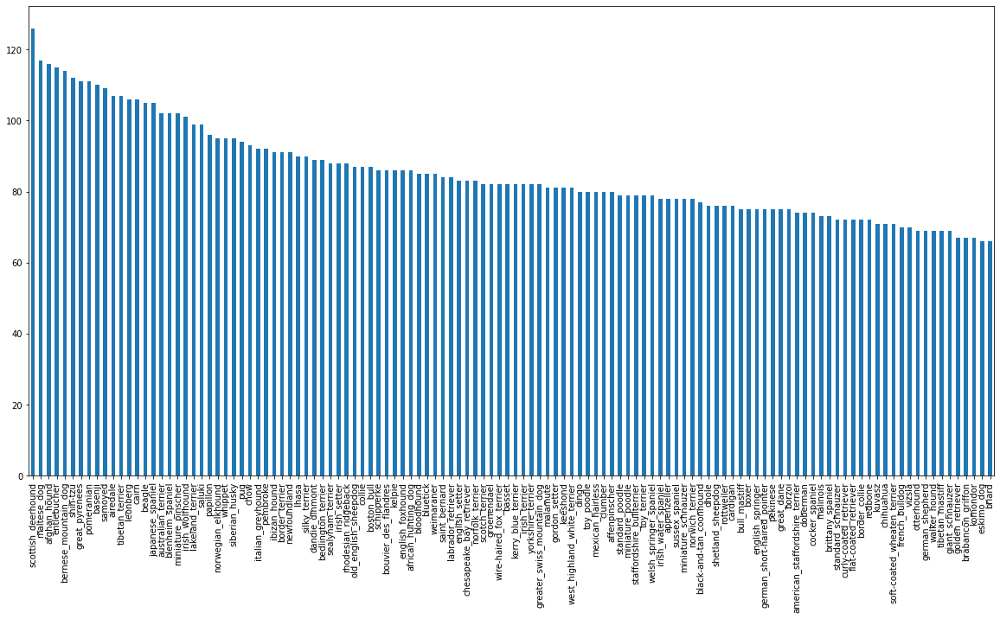

In [7]:


# Let's check how many images are there of breeds
label_csv['breed'].value_counts().plot.bar(figsize = (20,10));

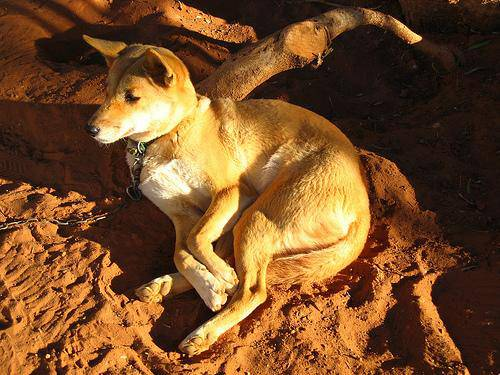

In [8]:

from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting Images and their labels
Let's get a list of Images pathnames

In [9]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [10]:
# Create pathname for Image["ID"]

filesname = ["drive/MyDrive/Dog Vision/train/" + fn + ".jpg" for fn in label_csv["id"]]
filesname[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [11]:
# Check whether the no. of filenames matches with number of image file
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train")) == len(filesname):
  print("filename matched")
else:
  print("file name not matched")




filename matched


In [12]:


len(os.listdir("drive/MyDrive/Dog Vision/train"))

10222

In [13]:


len(filesname)

10222

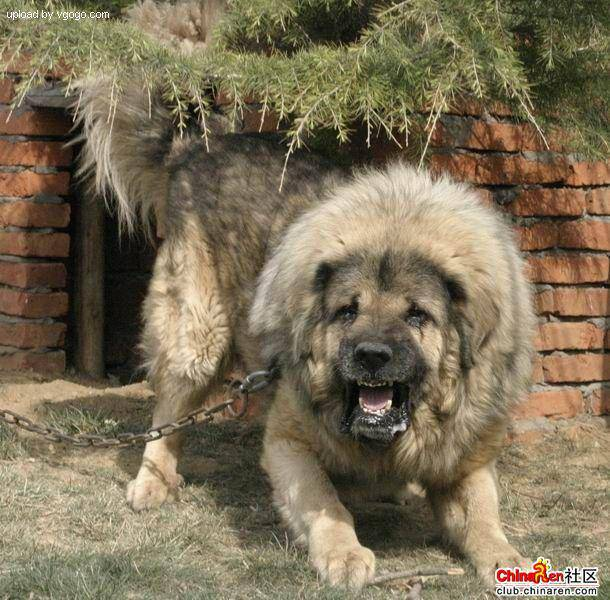

In [14]:













Image(filesname[9000])

In [15]:
label_csv["breed"][9000]

'tibetan_mastiff'


Since we have got our file path name. Now lets turn our data labels into Number

In [16]:
import numpy as np 
labels = label_csv["breed"]
labels  = np.array(labels)
labels




array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [17]:


len(labels)

10222

In [18]:


# See if  the number of labels matches number of filenames
if len(labels) == len(filesname):
  print("Okay lets smoke")
else:
  print("Its not okay,lets have a drink")  

Okay lets smoke


In [19]:


# Lets find the unique value
uni_breed_dog = np.unique(labels)
len(uni_breed_dog)

120

In [20]:



# Turn a single label into array of boolean
labels[0]
labels[0] == uni_breed_dog

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [21]:
# Turn every array into boolean array
boolean_label = [label == uni_breed_dog for label in labels]
boolean_label[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
len(boolean_label)

10222

In [23]:




# turning Boolean into  integer
print(labels[0]) # original label
print(np.where(uni_breed_dog == labels[0])) # index where label occurs
print(boolean_label[0].argmax())# index where label occurs in boolean array
print(boolean_label[0].astype(int)) # there will be 1 where sample occur


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


## Creating Our own Validation Set




In [29]:
# Set up X and y variables
X = filesname
y  = boolean_label

## We are going to start of experimenting 1000 images

In [30]:

# set the number of  images for experimenting
NUM_IMAGES = 1000 #@param {"type":"slider",min: 1000,max: 10000,step:1000}
NUM_IMAGES

1000

In [31]:

# lets split our data into train and validation set
from sklearn.model_selection import train_test_split
# split them into training and validation set of NUM_IMAGES
X_train ,X_val ,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                 test_size= 0.2,
                                                 random_state=42
                                                 )
len(X_train),len(X_val),len(y_train),len(y_val)

(800, 200, 800, 200)

## Preprocessing Images( Turning into Numeric)
To preprocess our Images we need to use a function which does few things. They are:
1. Take a image file path as input
2. Use tensorflow to read file and name it a variable `image`
3. Turn our `image`(.jpg) into tensor
4. Normalize our image(Convert the color channel value 0-255 to 0-1 value
5. resize the `image`(224,224)
6. Return the modified `image`

In [32]:
# Before lets see what importing  a image look like
# turning images into numpy array
from matplotlib.pyplot import imread
image  = imread(filesname[42])
image.shape




(257, 350, 3)

In [33]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [34]:
tf.constant(image[:2])
# turn image into tenso

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [35]:

# Define image size 
IMAGE_SIZE = 224
# Create a finction for preprocessing Images
def process_image(image_path,img_size = IMAGE_SIZE):
  # Read in a image file
  image = tf.io.read_file(image_path)
  # turn the .jpg image into tensor with 3 color channel (red,blue,green)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the color channel value from 0-255 to 0-1 value
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image
  image = tf.image.resize(image,size = [IMAGE_SIZE,IMAGE_SIZE])
  
  return image

## Turning our data into batches
AS we are to process 10000 + images it msy not fit into memory .
Thats why we do it by 32(Batchsize)
* In order to use TensorFlow effectively we need our data in tensor tuples (`image`, `label`)

In [36]:
# Create a simple function to return a tuple (image, label)
def get_img_label(image_path,label):
  image = process_image(image_path)
  return image , label

  

### Now we have got our data in form of tuples in tensor (`image` `label`) Lets make a function to turn all of our data(`X` and `y`) into batches

In [37]:
# Defining the Batch size, 32 is a good option
BATCH_SIZE = 32
#Create a function to turn data into batches
def create_data_batch(X,y=None,Batch_size = BATCH_SIZE, valid_data = None, test_data = None):
  # if data is a test data set we don't have labels
  if test_data:
    print("Creating test data batches")
    data  = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # only file path no label
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  #if a  data  is a valid dataset we don't need to shuffle it
  elif valid_data:
    print("Creating a validation data set")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),#filepath
                                               tf.constant(y))) #label
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)    
    return data_batch
  else:
    print("Creating training batches") 
    # Turn file path and label into tensor
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffleing the pathname and labels before mapping image processor function
    data  = data.shuffle(buffer_size =len(X))
    # create (image ,label) tuples (this can also turn image path into preprocessed image)
    data = data.map(get_img_label)
    # turn the training data into Batch
    data_batch = data.batch(BATCH_SIZE)
  
 
 
  return data_batch







In [38]:
# Create training and validation data batches
train_data = create_data_batch(X_train ,y_train)
val_data = create_data_batch(X_val, y_val, valid_data =True)



Creating training batches
Creating a validation data set


In [39]:
# Check Out the different attributes of our data batches
train_data.element_spec , val_data.element_spec


((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Now our data is in batches . Lets visualize them

In [40]:
import matplotlib.pyplot as plt
# Create a function to view images in data batches
def show_25_images(images, labels):
  # set up the figure
  plt.figure(figsize=(10,10))
  #loop through 25 for displaying 25 images
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image 
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(uni_breed_dog[labels[i].argmax()])
    # Turn the grid lines off
    #plt.axis("off")


In [41]:

train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [42]:

train_images, train_labels  = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels) 

(32, 32)

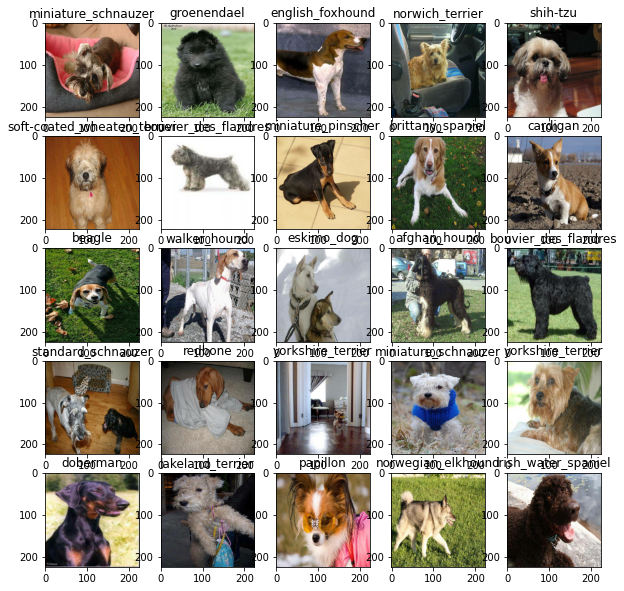

In [43]:
# Now lets visulalize the data into training batches
show_25_images(train_images,train_labels)

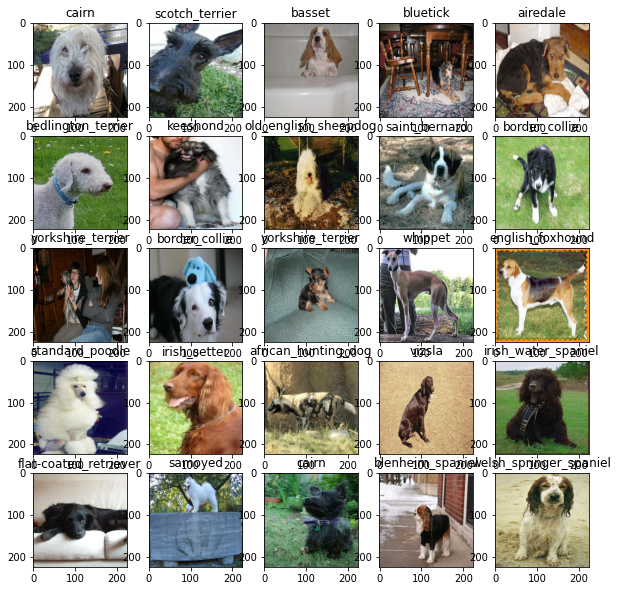

In [44]:
# Lets's visuliaze our validation set
val_images , val_labels  = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

from tensorflow.python.ops.gen_dataset_ops import model_dataset
## Building a model
Before building a model there are few things to Define.
1. The input shape( our images shape in form of tensor ) of our model
2. The output shape ( our image label in form of tensor) of our model.
3. The URL of the model we want to use from Tensorflow HUb

In [45]:
# Set  up the input shape of our model
INPUT_SHAPE = [None ,IMAGE_SIZE,IMAGE_SIZE,3] # Batch, height, width, colorchannel
OUTPUT_SHAPE = len(uni_breed_dog)
# SET up model UrL from tensorflow hub
MODEL_URL =  "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## Now we've got the inputs, outputs and model we're using ready to go. We can start to put them together

There are many ways of building a model in TensorFlow but one of the best ways to get started is to use the Keras API.

Defining a deep learning model in Keras can be as straightforward as saying, "here are the layers of the model, the input shape and the output shape, let's go!"

Knowing this, let's create a function which:

1. Takes the input shape, output shape and the model we've chosen's URL as parameters.
2. Defines the layers in a Keras model in a sequential fashion (do this first, then this, then that).
3. Compiles the model (says how it should be evaluated and improved).
4. Builds the model (tells it what kind of input shape it'll be getting).
5. Returns the model.


We'll take a look at the code first, then dicuss each part.

In [46]:

## Create function which build Keras model
def create_model(input_shape = INPUT_SHAPE ,output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):

  print("Building model:" , MODEL_URL)

   # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])
# Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), 
      optimizer=tf.keras.optimizers.Adam(), 
      metrics=["accuracy"] )
 # Build the model

  model.build(INPUT_SHAPE)
  
  return model
  

  
  
  


In [47]:
model  = create_model()
model.summary()

Building model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Creating CallBacks
We've got a model ready to go but before we train it we'll make some callbacks.

Callbacks are helper functions a model can use during training to do things such as save a models progress, check a models progress or stop training early if a model stops improving.

We will create two callbacks one is for TensorBoard another is for early stopping which will prevents our model from training too long

##TensorBoard CallBack
To set up a TensorBoard callback and view TensorBoard in a notebook, we need to do three things:

1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

In [48]:
# Load Tensorboard notebook extension
%load_ext tensorboard

In [49]:

import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Data/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)




In [50]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a model ( ON subset of data)
Our model is only goung to train 1000 images  to make sure everything is okay

In [51]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

#Lets create a simple function  which train a model. The function will be 
* Create a model using create_model().
* Setup a TensorBoard callback using create_tensorboard_callback() (we do this here so it creates a log directory of the current date and time).
* Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
Return the fitted model.


In [52]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [53]:
# fit the model to the data
model = train_model() 

Building model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 172s 6s/step - loss: 4.6644 - accuracy: 0.0925 - val_loss: 3.5743 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 3s 131ms/step - loss: 1.6913 - accuracy: 0.6587 - val_loss: 2.2335 - val_accuracy: 0.4500
Epoch 3/100
25/25 [==============================] - 4s 159ms/step - loss: 0.5726 - accuracy: 0.9463 - val_loss: 1.7071 - val_accuracy: 0.5750
Epoch 4/100
25/25 [==============================] - 4s 161ms/step - loss: 0.2562 - accuracy: 0.9900 - val_loss: 1.5344 - val_accuracy: 0.6000
Epoch 5/100
25/25 [==============================] - 3s 137ms/step - loss: 0.1481 - accuracy: 0.9975 - val_loss: 1.4473 - val_accuracy: 0.6200
Epoch 6/100
25/25 [==============================] - 4s 160ms/step - loss: 0.1005 - accuracy: 1.0000 - val_loss: 1.4052 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 3s

##Checking the TensorBoard logs
Now our model has been trained, we can make its performance visual by checking the TensorBoard logs.

The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and viualize its contents.

In [54]:
%tensorboard --logdir drive/My\ Drive/Data/logs

<IPython.core.display.Javascript object>

## Making and evaluating prediction using training model

In [55]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [56]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 1s 113ms/step


array([[1.35999278e-03, 3.06467409e-04, 5.34369959e-04, ...,
        6.61885715e-04, 5.22137379e-05, 9.71119851e-03],
       [2.74083082e-04, 8.90864525e-04, 3.08953691e-03, ...,
        8.36016668e-04, 1.54894183e-03, 1.25433231e-04],
       [4.39306459e-05, 4.64754354e-04, 6.89258668e-05, ...,
        1.11393537e-03, 2.59468798e-04, 9.81382839e-03],
       ...,
       [8.74805119e-05, 6.73488030e-05, 7.44418430e-05, ...,
        6.29570568e-05, 3.85388266e-05, 5.27635602e-05],
       [4.36973199e-03, 1.70123531e-04, 7.96106033e-05, ...,
        2.57743144e-04, 1.11834561e-04, 7.75670819e-03],
       [2.51493213e-04, 3.10811629e-05, 2.10524723e-03, ...,
        1.08536438e-03, 3.42606509e-04, 1.15440336e-04]], dtype=float32)

In [57]:
predictions.shape

(200, 120)

In [58]:
len(y_val
    )

200

In [59]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {uni_breed_dog[np.argmax(predictions[0])]}") # the predicted label

[1.35999278e-03 3.06467409e-04 5.34369959e-04 3.05080554e-04
 2.90433003e-04 8.11189784e-06 5.94094992e-02 4.32149216e-04
 9.43245977e-05 4.61998861e-04 4.80207702e-04 7.52913911e-05
 3.24068795e-04 1.19756209e-04 4.00994439e-04 1.52812700e-03
 3.99949677e-05 2.96560526e-01 1.27860121e-05 8.25546376e-05
 1.31946465e-03 2.17860274e-04 3.63350737e-05 3.61494184e-03
 9.55499345e-05 1.45400118e-04 1.13996238e-01 2.98531610e-04
 6.88420259e-04 6.89462002e-04 7.14240959e-05 5.56583924e-04
 2.24367273e-03 1.30288718e-05 1.25323539e-04 4.88751307e-02
 1.81100095e-05 9.41364124e-05 9.02838248e-04 1.67876261e-03
 6.65744825e-04 9.51380352e-05 3.42551823e-04 1.27508451e-04
 6.26273395e-04 3.46153305e-04 3.98357006e-05 1.98599781e-04
 1.21187739e-04 2.06332174e-04 1.01732796e-04 2.98419891e-05
 1.23473932e-04 1.29911292e-03 8.60669388e-05 7.68269238e-05
 1.02629943e-04 6.72633247e-03 5.73751924e-04 4.74472381e-02
 1.20232883e-03 2.38250446e-04 1.82855257e-03 9.54337374e-05
 2.19378286e-04 4.031934

Having this information is great but it would be even better if we could compare a prediction to its true label and original image.

To help us, let's first build a little function to convert prediction probabilities into predicted labels.

Note: Prediction probabilities are also known as confidence levels.

In [60]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return uni_breed_dog[np.argmax(prediction_probabilities)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'border_terrier'

Since our validation data (val_data) is in batch form, to get a list of validation images and labels, we'll have to unbatch it (using unbatch()) and then turn it into an iterator using as_numpy_iterator().

Let's make a small function to do so.

In [61]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images_ = []
  labels_ = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(uni_breed_dog[np.argmax(label)])
  return images_, labels_

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.2770141 , 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

Now we've got ways to get:

* Prediction labels
* Validation labels (truth labels)
* Validation images


Let's make some functions to make these all a bit more visualize.

The first function we'll create will:

1. Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
2. Convert the prediction probabilities to a predicted label.
3. Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [62]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

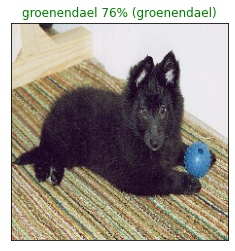

In [63]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n= 77
          )

Now let's make another view to see top 10 predictions
This function will:
1. Take an input of a prediction probabilities array, a ground truth labels array and an integer.
2. Find the predicted label using get_pred_label().
3. find the top 10:
* Prediction probabilities indexes
* Prediction probabilities values
* Prediction labels
4. Plot the top 10 prediction probability values and labels, coloring the true label green.


In [64]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = uni_breed_dog[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

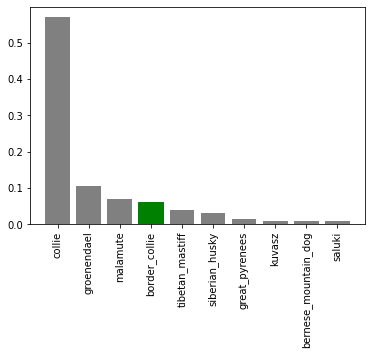

In [65]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to help us visualize our predictions and evaluate our model, let's check out a few.

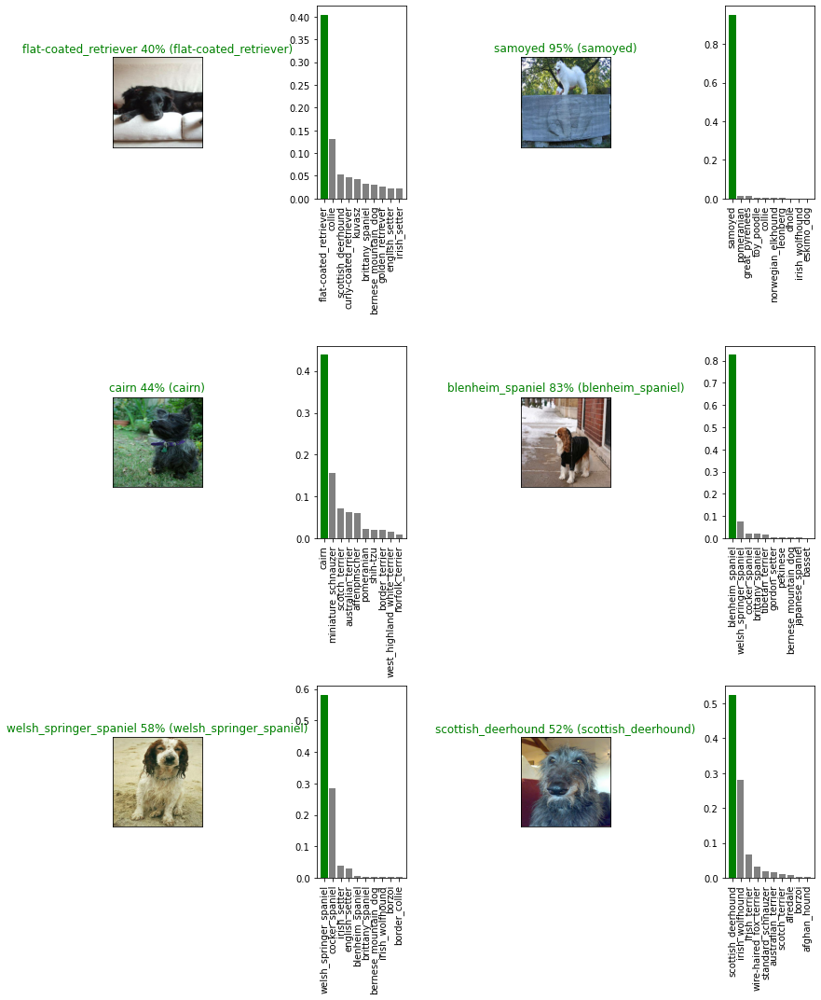

In [66]:
# Let's check a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(3*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

##Saving  and reloading a model




In [67]:
# Create a function to save model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [68]:
# Create a function to load train model
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [69]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20220524-08531653382384-1000-images-Adam.h5...


'drive/My Drive/Dog Vision/models/20220524-08531653382384-1000-images-Adam.h5'

In [70]:
# Load our model trained on 1000 images
model_1000_images = load_model('/content/drive/MyDrive/Dog Vision/models/20220522-15471653234430-1000-images-Adam.h5')

Loading saved model from: /content/drive/MyDrive/Dog Vision/models/20220522-15471653234430-1000-images-Adam.h5


In [71]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 91ms/step - loss: 1.3282 - accuracy: 0.6450


[1.3282455205917358, 0.6449999809265137]

In [72]:
# Evaluate the loaded model
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 98ms/step - loss: 1.1714 - accuracy: 0.6450


[1.1714046001434326, 0.6449999809265137]

##Training a model of DOG (on full data)

In [73]:
len(X),len(y)

(10222, 10222)

In [74]:
# Turn full training data in a data batch
full_data = create_data_batch(X,y)

Creating training batches


In [75]:
# Instantiate a new model for training on the full dataset
full_model = create_model()

Building model: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [76]:
# Create full model callbacks

# TensorBoard callback
full_model_tensorboard = create_tensorboard_callback()

# Early stopping callback
# Note: No validation set when training on all the data, therefore can't monitor validation accruacy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [77]:
%tensorboard --logdir drive/My\ Drive/Dog Vision/logs

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
usage: tensorboard [-h] [--helpfull] [--logdir PATH] [--logdir_spec PATH_SPEC]
                   [--host ADDR] [--bind_all] [--port PORT]
                   [--reuse_port BOOL] [--load_fast {false,auto,true}]
                   [--extra_data_server_flags EXTRA_DATA_SERVER_FLAGS]
                   [--grpc_creds_type {local,ssl,ssl_dev}]
                   [--grpc_data_provider PORT] [--purge_orphaned_data BOOL]
                   [--db URI] [--db_import] [--inspect] [--version_tb]
                   [--tag TAG] [--event_file PATH] [--path_prefix PATH]
                   [--window_title TEXT] [--max_reload_threads COUNT]
                   [--reload_interval SECONDS] [--reload_task TYPE]
                   [--reload_multifile BOOL]
                   [--reload_multifile_inactive_secs SECONDS]
                   [--generic_data TYPE]
                   [--samples_per_plugin SAMPLES_PER_PLUGIN]
                   [-

In [78]:
# Fit the full model to the full training data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, 
                          full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 1520s 5s/step - loss: 1.3207 - accuracy: 0.6762
Epoch 2/100
320/320 [==============================] - 36s 111ms/step - loss: 0.3987 - accuracy: 0.8817
Epoch 3/100
320/320 [==============================] - 36s 112ms/step - loss: 0.2370 - accuracy: 0.9340
Epoch 4/100
320/320 [==============================] - 37s 117ms/step - loss: 0.1509 - accuracy: 0.9650
Epoch 5/100
320/320 [==============================] - 33s 102ms/step - loss: 0.1064 - accuracy: 0.9775
Epoch 6/100
320/320 [==============================] - 32s 99ms/step - loss: 0.0778 - accuracy: 0.9867
Epoch 7/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0604 - accuracy: 0.9904
Epoch 8/100
320/320 [==============================] - 32s 100ms/step - loss: 0.0458 - accuracy: 0.9951
Epoch 9/100
320/320 [==============================] - 31s 98ms/step - loss: 0.0367 - accuracy: 0.9961
Epoch 10/100
320/320 [==============================] - 37s 116ms/s

In [79]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20220524-09271653384471-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20220524-09271653384471-full-image-set-mobilenetv2-Adam.h5'

In [80]:
# Load in full model
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20220524-09271653384471-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20220524-09271653384471-full-image-set-mobilenetv2-Adam.h5


#Making prediction on test data set

Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. 
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). 
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [81]:
test_path = "drive/MyDrive/Dog Vision/test"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/testde327414ced20d4e6f786a68bff82e10.jpg',
 'drive/MyDrive/Dog Vision/teste298c484aa05012775db02f3596e1d18.jpg',
 'drive/MyDrive/Dog Vision/teste62be234fa4a073e375af9f724261378.jpg',
 'drive/MyDrive/Dog Vision/teste35b90290702042d17ceee2aaf2d1475.jpg',
 'drive/MyDrive/Dog Vision/teste7afb35b8252782013a6700e28e327fa.jpg',
 'drive/MyDrive/Dog Vision/teste330d9cfe81e42338ddbf8a121930e83.jpg',
 'drive/MyDrive/Dog Vision/teste6ec1891d8f52a13683c73cabd3045cb.jpg',
 'drive/MyDrive/Dog Vision/testdcd3cfe0cd6d363a3ed21639c434c8d3.jpg',
 'drive/MyDrive/Dog Vision/teste64d56f012476f124591a22648114a37.jpg',
 'drive/MyDrive/Dog Vision/testdfa54e85c1309d8a9933deedc1d775c7.jpg']

In [83]:
# Create test data batch
test_data = create_data_batch(test_filenames, test_data=True)

Creating test data batches


In [88]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

In [89]:
 #Save predictions (NumPy array) to csv file (for access later)
#np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predctions, delimiter=",")

In [91]:
#test_predictions[:10]